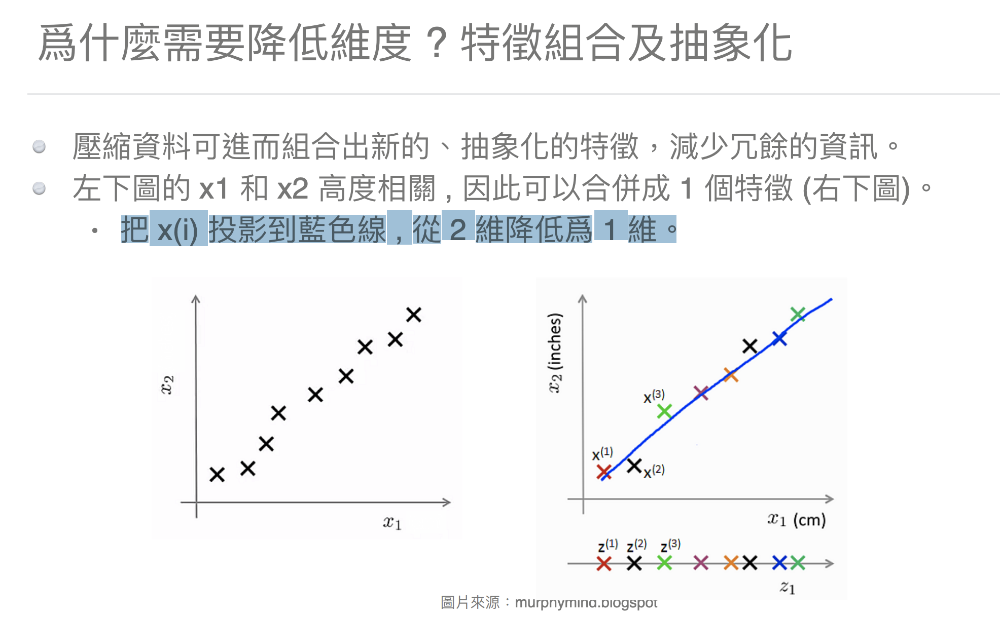

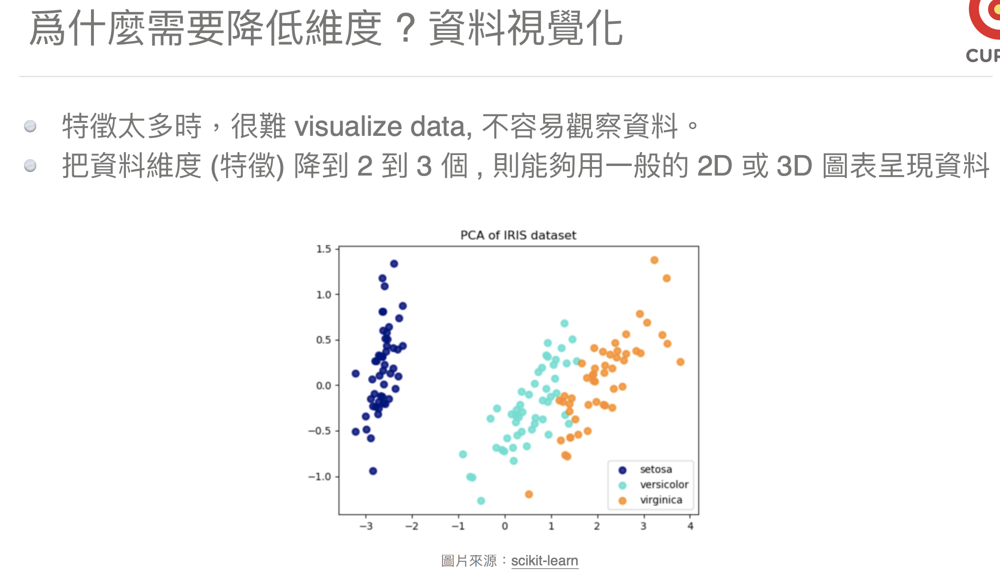

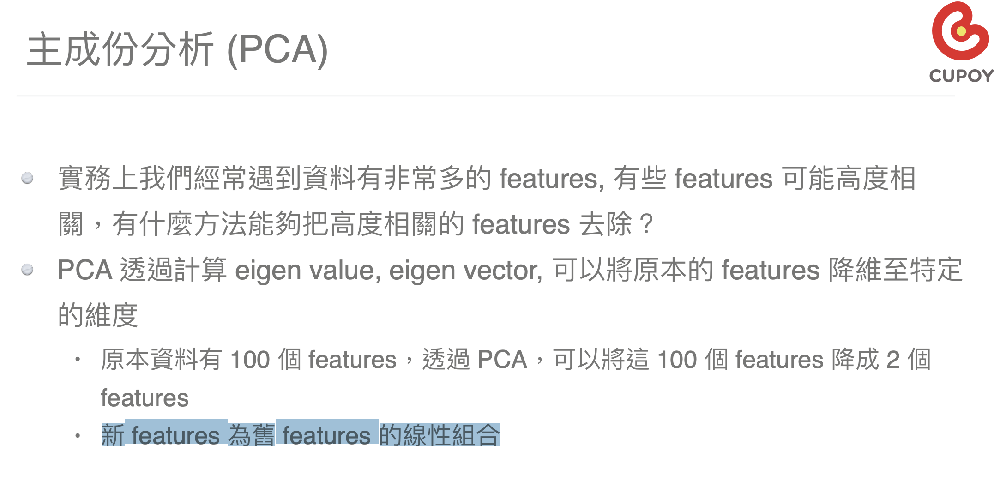

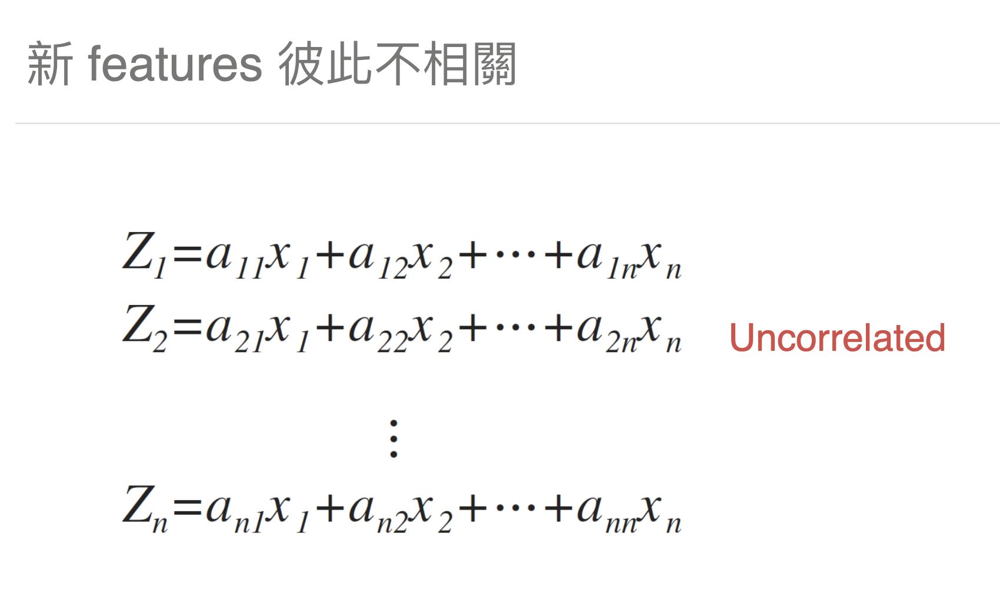

## PCA 範例

(Optional) 若尚未安裝相關套件，執行下一行，然後 restart kernel

In [1]:
# !pip3 install --user sklearn
# !pip3 install --user --upgrade matplotlib

載入套件

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from sklearn import decomposition
from sklearn import datasets

np.random.seed(5)
%matplotlib inline

載入 iris 資料集

In [3]:
iris = datasets.load_iris()
X = iris.data
y = iris.target

設定 模型 估計參數

In [4]:
centers = [[1, 1], [-1, -1], [1, -1]]
pca = decomposition.PCA(n_components=3)

資料建模 並 視覺化 結果

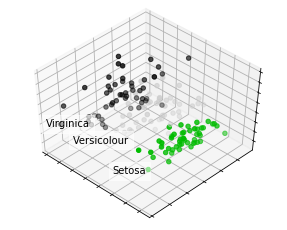

In [5]:
pca.fit(X)
X = pca.transform(X)

fig = plt.figure(1, figsize=(4, 3))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
plt.cla()


for name, label in [('Setosa', 0), ('Versicolour', 1), ('Virginica', 2)]:
    ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean() + 1.5,
              X[y == label, 2].mean(), name,
              horizontalalignment='center',
              bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.nipy_spectral) #edgecolor='k'
           

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

## 作業

用 digits (3個數字即可 , dataset.load_digits(n_class=3)) 資料嘗試跑 PCA

載入 相關套件 並 執行 PCA 實驗 ...

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from sklearn import decomposition
from sklearn import datasets

np.random.seed(5)
%matplotlib inline

In [7]:
from sklearn import datasets

digits = datasets.load_digits(n_class=3)
X = digits.data
y = digits.target

In [8]:
# centers = [[1, 1], [-1, -1], [1, -1]]
pca = decomposition.PCA(n_components=3)

In [9]:
# fit & transform
pca.fit(X)
X = pca.transform(X)

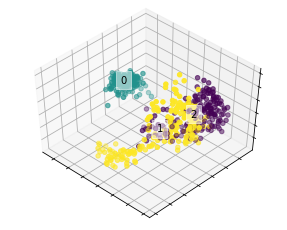

In [10]:
# 寫法 1

fig = plt.figure(1, figsize=(4, 3))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
plt.cla()


for name, label in [('0', 0), ('1', 1), ('2', 2)]:
    ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean() + 1.5,
              X[y == label, 2].mean(), name,
              horizontalalignment='center',
              bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
# Reorder the labels to have colors matching the cluster results
y = np.choose(y, [1, 2, 0]).astype(np.float)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y) # edgecolor='k' , cmap=plt.cm.nipy_spectral
           

ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()


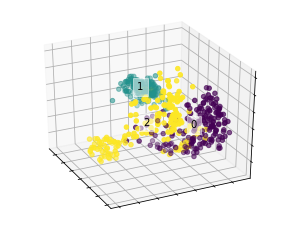

In [11]:
# 寫法 2

fig = plt.figure(figsize=(4, 3))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=30, azim=154)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y.astype(np.float))

for name, label in [('0', 0), ('1', 1), ('2', 2)]:
    ax.text3D(X[y == label, 0].mean(),
              X[y == label, 1].mean() + 1.5,
              X[y == label, 2].mean(), name,
              horizontalalignment='center',
              bbox=dict(alpha=.5, edgecolor='w', facecolor='w'))
    
ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])

plt.show()

## 參考資料

## [1. Unsupervised learning 影片來源：Statistical Learning](https://www.youtube.com/watch?time_continue=625&v=ipyxSYXgzjQ)

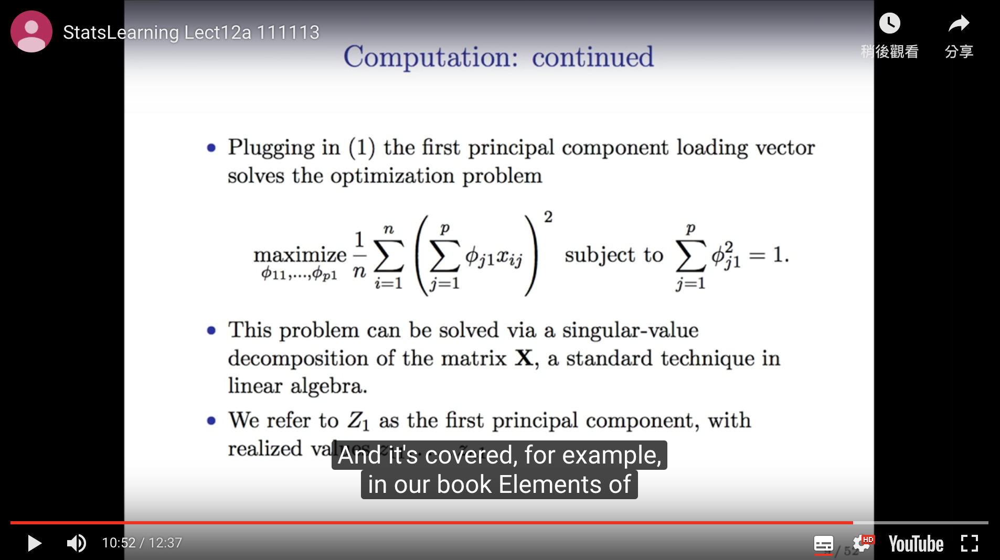

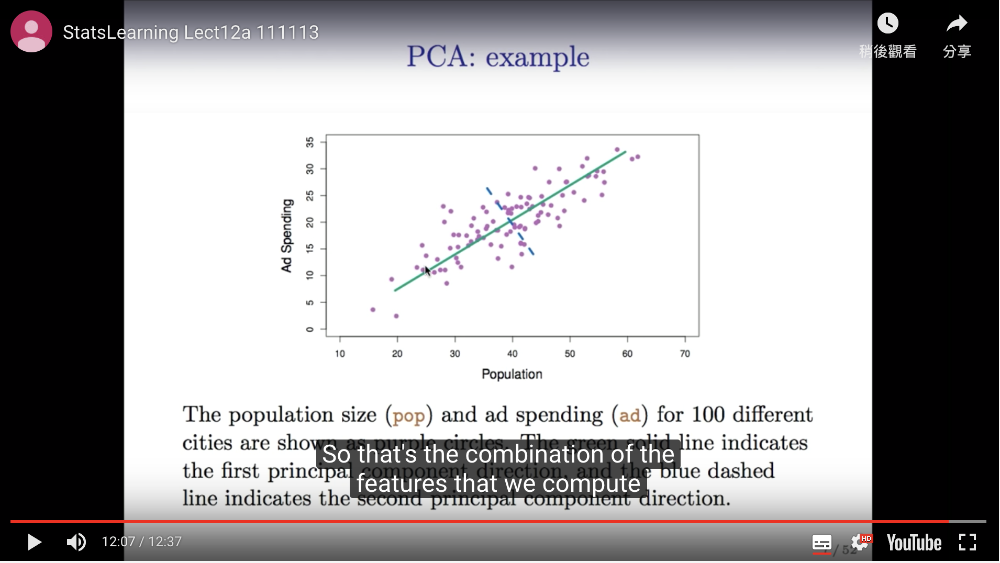

## [2. Further Principal Components 影片來源：Statistical Learning](https://www.youtube.com/watch?time_continue=552&v=dbuSGWCgdzw)

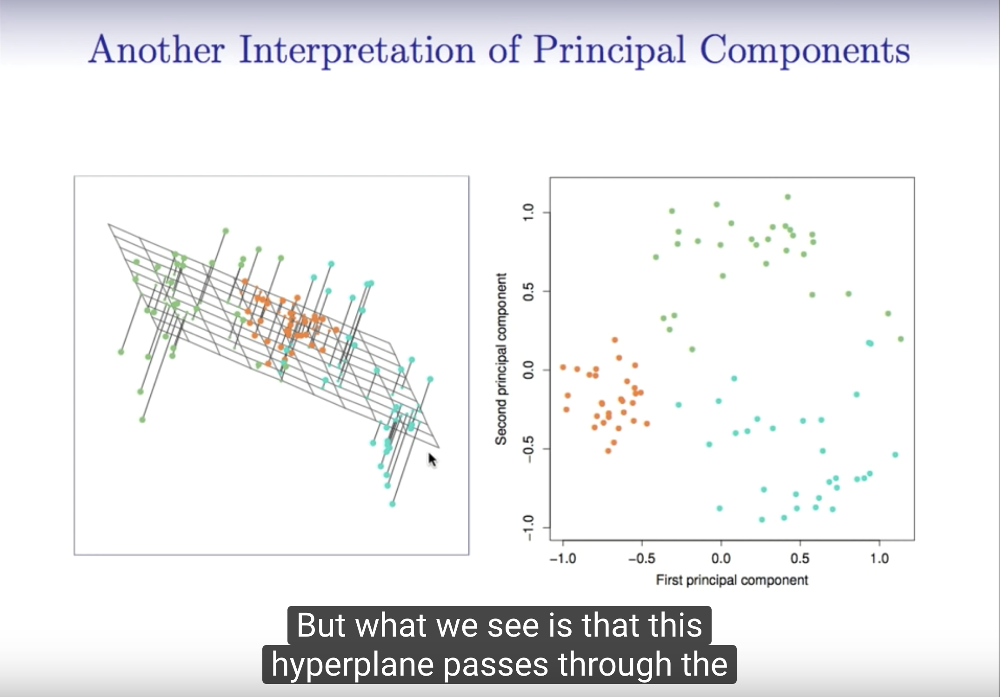

8:19

> - And it turns out that the hyperplane is defined in terms of the two largest principal components. 
> - In other words, the direction vectors that define the hyperplane, if you think of having two-direction vectors in the hyperplane, it'll be <font color="red">orthogonal</font> to each other. 
> - Those are also the two-direction vectors of <font color="red">the largest two principal components</font>. (下圖藍色的2個vector)



8:45

> - To get closest to the data to find the plane closest to the points, <font color="red">we're asking actually that the projection of the points in the plane are spread out as much as possible</font>.
> - In other words, spread out means as much <font color="red">variance</font> as possible.



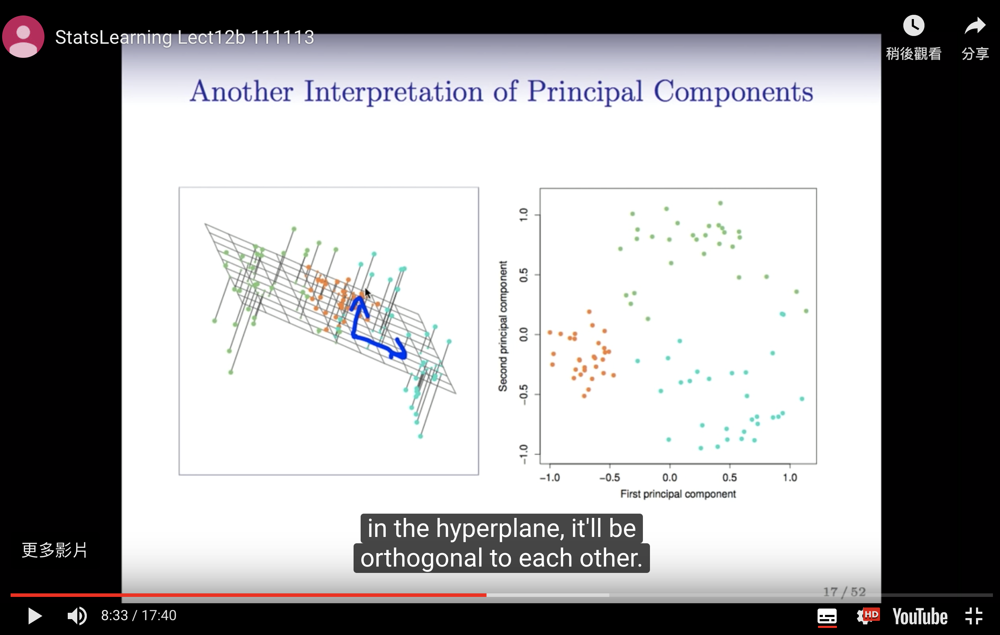

## [3. Principal Components Regression 影片來源：Statistical Learning](https://www.youtube.com/watch?time_continue=401&v=eYxwWGJcOfw)

> - ### <font color="purple">上方紫線 : Error (Total MSE)</font>
> - ### <font color="green">中間綠線 : variance</font>
> - ### <font color="black">下方黑線 : bias</font>
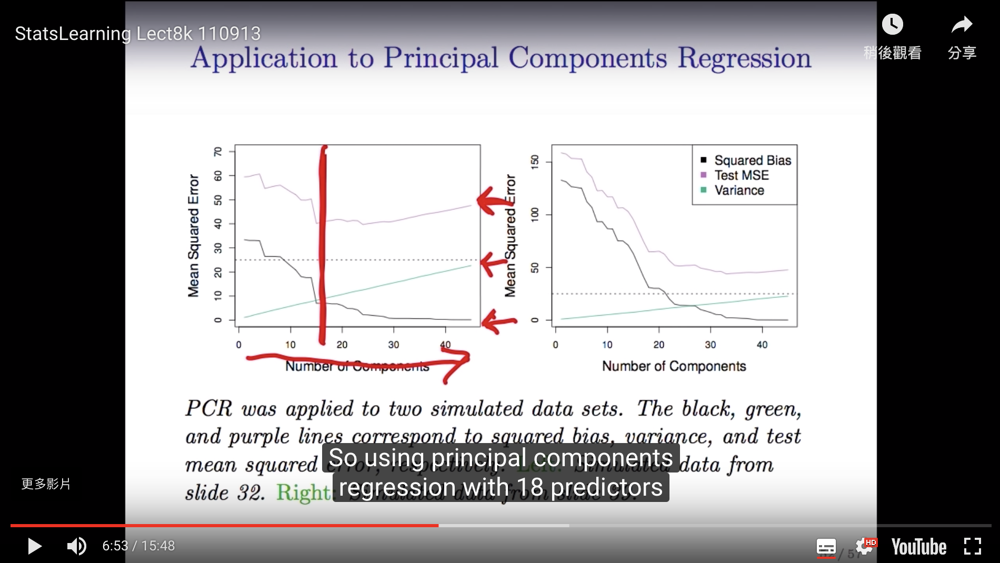

## [4. Dimentional Reduction 影片來源 Andrew Ng](https://www.youtube.com/watch?time_continue=36&v=rng04VJxUt4)

### feature scaling

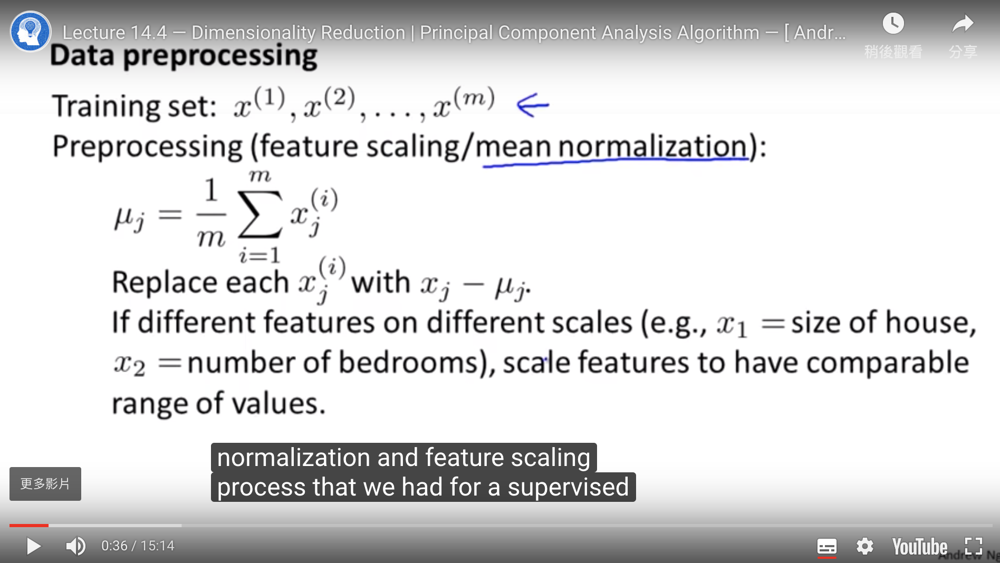

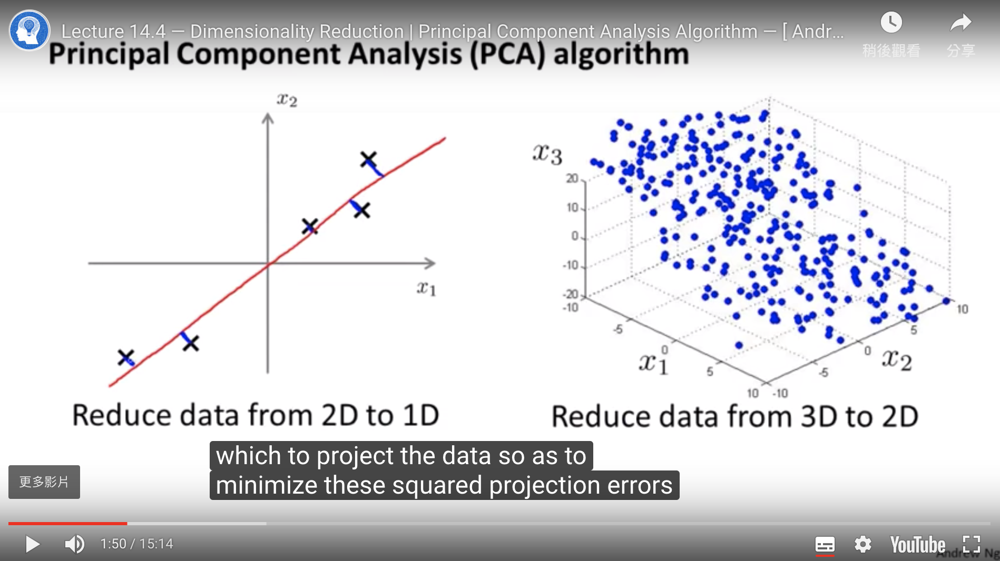

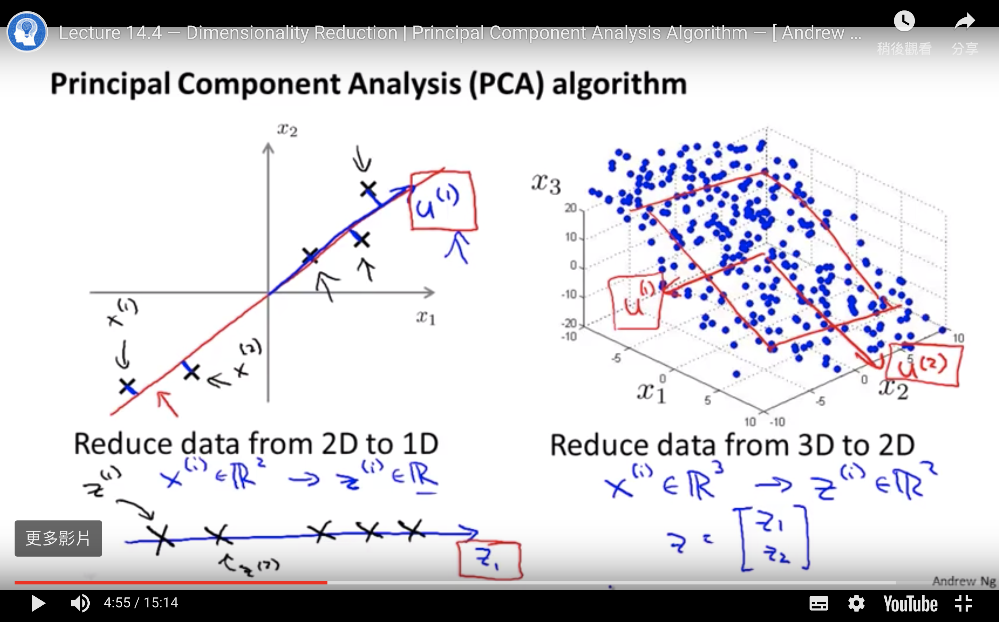

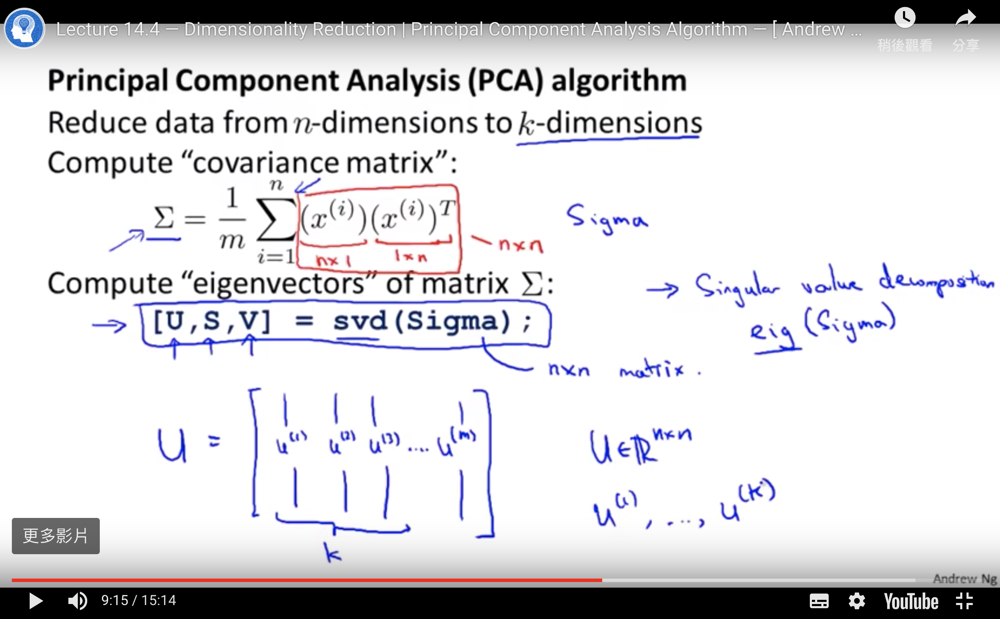

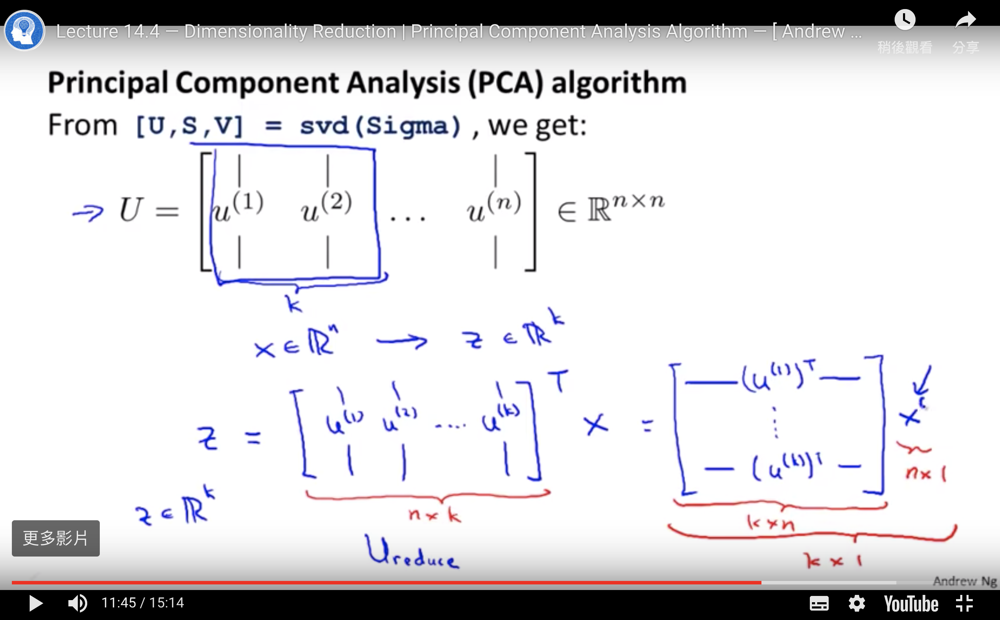

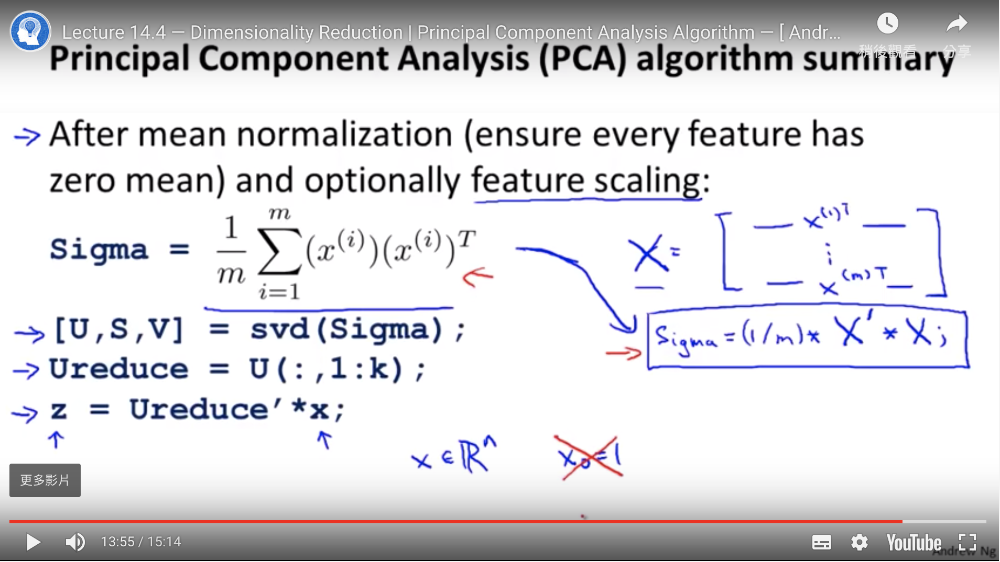

## [淺談降維方法中的 PCA 與 t-SNE](https://medium.com/d-d-mag/%E6%B7%BA%E8%AB%87%E5%85%A9%E7%A8%AE%E9%99%8D%E7%B6%AD%E6%96%B9%E6%B3%95-pca-%E8%88%87-t-sne-d4254916925b)


以下是 PCA 的主要步驟：

> 1. 將數據標準化
> 2. 建立共變異數矩陣（covariance matrix）
> 3. 利用奇異值分解（SVD）求得特徵向量（eigenvector）跟特徵值（eigenvalue）
> 4. 通常特徵值會由大到小排列，選取 k 個特徵值與特徵向量
> 5. 將原本的數據投影（映射）到特徵向量上，得到新的特徵數

PCA 最重要的部分就是奇異值分解，因此接下來的章節讓我們來談談奇異值分解

---

實測：使用 MNIST 測試
測試集可以到這裡下載，首先我們先用 PCA 降到二維看看。

> ### PCA
> - 可以發現降到二維之後，資料幾乎被搗成一團，完全看不出集群，這是因為 PCA 的線性降維在過程中損失太多訊息。
> ![img1](https://miro.medium.com/max/1000/1*Be6oSLuXgG0cDi2gJEL-wA.jpeg)


> ### t-SNE
> - 這是使用 t-SNE 後的降維結果，可以發現降維過後，資料仍然分群地相當明確。從這兩張圖可以非常明顯看出這兩者（PCA, t-SNE）的差別。
> ![img2](https://miro.medium.com/max/1000/1*5i8McPBKmFOMOcCDjl8w4Q.jpeg)




### 小結
後來又有人提出一連串改善 t-SNE 效能的演算法，詳情可以參考[Accelerating t-sne using tree-based algorithms](https://lvdmaaten.github.io/publications/papers/JMLR_2014.pdf)，大部分熱門的資料分析程式語言也都有實作，像是 sklearn, R, matlab 等等。

不過畢竟 t-SNE 不是線性降維，在執行時間上會比 PCA 來得久許多。

- 當特徵數量過多時，使用 PCA 可能會造成降維後的特徵欠擬合（underfitting），這時可以考慮使用 t-SNE 來降維

- t-SNE 的需要比較多的時間執行

- 論文當中還有一些優化技巧（如何選擇困惑度等等），因為還沒有閱讀完畢，之後會再逐漸補上
